<a href="https://colab.research.google.com/github/honhon13/sample/blob/main/Copy_of_Workshop_SL2_MAK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Quantum Chemical properties prediction using deep learning

**Theoretical Background**

**SMILES Representation**: SMILES is a widely used notation for representing chemical structures as strings. It encodes molecular graphs into a linear format, making it suitable for computational processing.

**Tokenization**: Tokenization is the process of breaking down a string into smaller components (tokens). For SMILES, this involves identifying atoms, bonds, and other structural elements.

**Vocabulary Building**: A vocabulary is a mapping of unique tokens to indices. It is essential for converting text data into numerical representations for machine learning.

**One-Hot Encoding**: One-hot encoding is a technique for representing categorical data as binary vectors. Each category (token) is assigned a unique vector with a single 1 and the rest 0. This is useful for feeding categorical data into models that require numerical input.

https://www.sciencedirect.com/science/article/pii/S1359644620300465

https://link.springer.com/article/10.1007/s11030-023-10771-y

In [ ]:
!pip install torch torchvision torchaudio
!pip install pandas scikit-learn matplotlib

In [ ]:
import re
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader, Subset, TensorDataset
from sklearn.model_selection import train_test_split

## Load dataset

Here is the brief description about the dataset

https://pytorch-geometric.readthedocs.io/en/latest/generated/torch_geometric.datasets.QM9.html

In [ ]:
#df = pd.read_csv(("qm9.csv.gz"), compression="gzip")
#df.head()

### dataset columns

mol_id = molecule id

A, B, C = rotational constants (GHz)

U_atom, U0_atom, H_atom, G_atom = Atomization energy (eV)

Cv = Heat capacity (Cal/molK)

G = Free energy at 298.15K (eV)

H = Enthalpy at 298.15K (eV)

U = Internal energy at 298.15K (eV)

U0 = Internal energy at 0K (eV)

ZPVE = Zero point vibrational energy (eV)

R2 = Electronic spatial extent (a02)

DeltaE = Gap b/w HOMO and LUMO energy (eV)

e HUMO = energy Highest occupied molecular orbital

e LUMO = energy Lowest unoccupied molecular orbital

**alpha = isotropic polarizability (a03)**

mu = Dipole moment (D)

**SMILES = Simplified Molecular Input Line Entry System**


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv("/content/drive/My Drive/Databases/qm9.csv.gz", compression="gzip")

### Use CUDA if available

In [ ]:
# Use cuda if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Seed random generator
_ = torch.manual_seed(42)

## EDA

In [ ]:
print(df.shape)  # Check the shape of the DataFrame
print(df["smiles"].shape)  # Check the shape of the 'smiles' column
print(df["alpha"].shape)  # Check the shape of the 'alpha' column

(132480, 21)
(132480,)
(132480,)


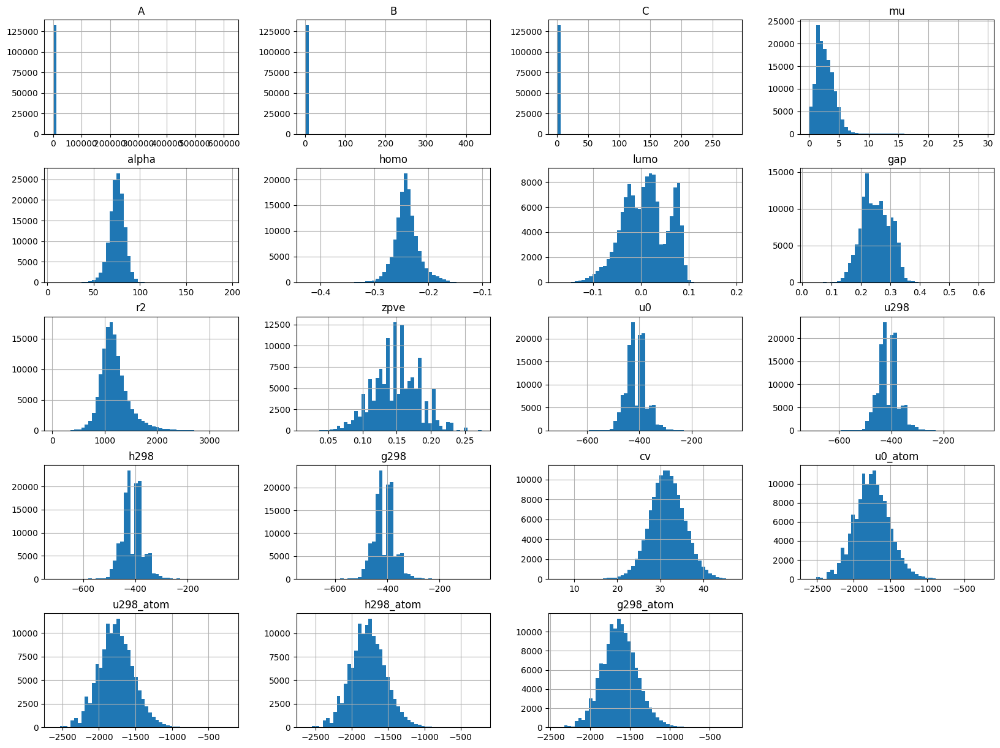

In [ ]:
df.hist(bins=50, figsize=(20,15))
plt.show()

## Preprocessing

**def_init**
This method initializes a class with a regular expression (regex) pattern that is used to tokenize SMILES strings. The regex pattern is designed to capture the various components of a SMILES string, such as:


*   **Atoms**: Single-letter (e.g., C, N, O) or multi-letter symbols (e.g., Br, Cl).
*   **Bonds**: Single (-), double (=), triple (#), or aromatic bonds.
*   **Special characters:** Parentheses, charges (+, -), and ring closures (1, 2, etc.).
*   **Other symbols**: Branching ((, )), stereochemistry (@), and isotopes.
The regex ensures that the SMILES string is split into meaningful tokens for further processing.

**def tokenize**
The tokenize method takes a SMILES string as input and uses the regex pattern to split it into individual tokens. These tokens represent the smallest meaningful components of the SMILES string, such as atoms, bonds, or special symbols.

Input: A SMILES string (e.g., "CCO" for ethanol).
Output: A list of tokens (e.g., ['C', 'C', 'O']).
This step is crucial for converting the SMILES string into a format that can be processed by machine learning models.

The build_vocab function creates a vocabulary of tokens from a list of SMILES strings. It performs the following steps:

Tokenization: Each SMILES string in the list is tokenized using the tokenize method.
Counting Tokens: A Counter is used to count the frequency of each token across all SMILES strings.
Vocabulary Creation: The most frequent tokens (up to max_vocab_size) are selected, and a dictionary is created that maps each token to a unique index.
Input: A list of SMILES strings, a tokenizer, and the maximum vocabulary size.
Output: A dictionary mapping tokens to indices.
This vocabulary is essential for converting tokens into numerical representations that can be used in machine learning models.

The smiles_to_ohe function converts a SMILES string into a one-hot encoded (OHE) representation. It performs the following steps:

Tokenization: The SMILES string is tokenized into a list of tokens.
Token-to-ID Mapping: Each token is mapped to its corresponding index in the vocabulary. If a token is not in the vocabulary, it is assigned the index of the "unknown" token.
One-Hot Encoding: A one-hot encoding is created using torch.eye, where each token is represented as a binary vector with a 1 at the position corresponding to its index.
Input: A SMILES string, a tokenizer, and a vocabulary.
Output: A one-hot encoded tensor representing the SMILES string.
This representation is commonly used in machine learning because it allows categorical data (tokens) to be represented numerically in a way that preserves their distinctiveness.

**EXAMPLE**

This part processes a SMILES string, which is a textual representation of a chemical structure, to prepare it for machine learning tasks. The SMILES string provided represents the molecule abiraterone, and the first step involves tokenizing it using the SmilesTokenizer. Tokenization breaks the string into meaningful units, such as atoms (C, O), bond types (=), and ring closures (4, 3, etc.). The resulting tokens are: O, C, 4, C, C, 3, =, C, C, C, 5, C, 2, C, C, c, 1, c, c, c, n, c, 1, =, C, C, 2, C, C, C, C, 5, C, 3, C, C, C, 4.

Next, a vocabulary is built from the tokens using the build_vocab function. The vocabulary maps unique tokens to integer indices, but only includes tokens that appear at least three times in the SMILES string. In this case, the vocabulary is {'C': 0, 'c': 1, '4': 2}, meaning 'C' is assigned index 0, 'c' is assigned index 1, and '4' is assigned index 2. Tokens like O, 3, and = are excluded because they appear less than three times.

The SMILES string is converted into a one-hot encoding (OHE) representation using the vocabulary. Each token is represented as a binary vector where the length equals the size of the vocabulary. For example, 'C' is [1, 0, 0], 'c' is [0, 1, 0], and '4' is [0, 0, 1]. The OHE matrix is constructed by stacking these vectors for each token in the SMILES string. Each row in the matrix corresponds to a token in the vocabulary, and each column represents a token in the SMILES string. This transformation prepares the SMILES string for use in machine learning models, enabling tasks like molecular property prediction or drug discovery.

In [ ]:
class SmilesTokenizer(object):
    def __init__(self):
        self.regex_pattern = (
            r"(\[[^]]+]|Br?|Cl?|N|O|S|P|F|I|b|c|n|o|s|p|"
            r"\(|\)|\.|=|#|-|\+|\\|\/|:|~|@|\?|>>?|\*|\$|\%[0-9]{2}|[0-9])"
        )
        self.regex = re.compile(self.regex_pattern)

    def tokenize(self, smiles):
        tokens = [token for token in self.regex.findall(smiles)]
        print("Tokenized SMILES:", tokens)  # Print tokens
        return tokens

def build_vocab(smiles_list, tokenizer, max_vocab_size):
    tokenized_smiles = [tokenizer.tokenize(s) for s in smiles_list]
    print("Tokenized SMILES List:", tokenized_smiles)  # Print all tokenized SMILES
    token_counter = Counter(c for s in tokenized_smiles for c in s)
    print("Token Frequencies:", token_counter)  # Print token counts
    tokens = [token for token, _ in token_counter.most_common(max_vocab_size)]
    vocab = {token: idx for idx, token in enumerate(tokens)}
    print("Vocabulary:", vocab)  # Print vocab
    return vocab

def smiles_to_ohe(smiles, tokenizer, vocab):
    unknown_token_id = len(vocab) - 1
    token_ids = [vocab.get(token, unknown_token_id) for token in tokenizer.tokenize(smiles)]
    print("Token Indices:", token_ids)  # Print token indices
    ohe = torch.eye(len(vocab))[token_ids]
    print("One-Hot Encoded Matrix:\n", ohe)  # Print OHE matrix
    return ohe

# SMILES Example
smiles = "CC(O)=O"
tokenizer = SmilesTokenizer()
print("SMILES String:", smiles)

# Tokenization
tokens = tokenizer.tokenize(smiles)

# Build Vocabulary
vocab = build_vocab([smiles], tokenizer, 5)

# One-Hot Encoding
ohe = smiles_to_ohe(smiles, tokenizer, vocab)

print("Final One-Hot Encoding (as numpy array):\n", np.array(ohe))


SMILES String: CC(O)=O
Tokenized SMILES: ['C', 'C', '(', 'O', ')', '=', 'O']
Tokenized SMILES: ['C', 'C', '(', 'O', ')', '=', 'O']
Tokenized SMILES List: [['C', 'C', '(', 'O', ')', '=', 'O']]
Token Frequencies: Counter({'C': 2, 'O': 2, '(': 1, ')': 1, '=': 1})
Vocabulary: {'C': 0, 'O': 1, '(': 2, ')': 3, '=': 4}
Tokenized SMILES: ['C', 'C', '(', 'O', ')', '=', 'O']
Token Indices: [0, 0, 2, 1, 3, 4, 1]
One-Hot Encoded Matrix:
 tensor([[1., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0.],
        [0., 1., 0., 0., 0.],
        [0., 0., 0., 1., 0.],
        [0., 0., 0., 0., 1.],
        [0., 1., 0., 0., 0.]])
Final One-Hot Encoding (as numpy array):
 [[1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0.]]


## Prepare datset for modeling

In [ ]:
# Prepare data
sample_size = 132480
n_train = 105984
n_test = n_val = 13248

# Get a sample
df = df.sample(n=sample_size, axis=0, random_state=42)

#### "alpha" was taken in this case

In [ ]:
# Select columns from the data frame
smiles = df["smiles"].tolist()
y = df["alpha"].to_numpy()

In [ ]:
# Build a vocab using the training data
max_vocab_size = 30
vocab = build_vocab(smiles[:n_train], tokenizer, max_vocab_size)
vocab_size = len(vocab)


Streaming output truncated to the last 5000 lines.
Tokenized SMILES: ['O', '[C@@H]', '1', 'C', '=', 'C', '[C@@H]', '2', 'C', '[C@@H]', '2', 'O', 'C', '1']
Tokenized SMILES: ['O', '=', 'C', 'O', '[C@@H]', '1', 'C', '[C@@H]', '1', 'C', 'C', 'O']
Tokenized SMILES: ['C', '#', 'C', '[C@]', '(', 'C', ')', '(', 'O', ')', 'C', '(', '=', 'O', ')', 'O', 'C']
Tokenized SMILES: ['C', '[NH2+]', 'C', '1', '[C@H]', '2', 'O', '[C@H]', '3', 'C', '[N@@H+]', '1', '[C@H]', '3', '2']
Tokenized SMILES: ['C', 'C', '(', 'C', ')', '[C@@]', '1', '2', 'C', '=', 'C', '[C@@H]', '(', 'C', '1', ')', 'O', '2']
Tokenized SMILES: ['C', '[C@@]', '1', '(', 'C', 'O', ')', 'C', '[C@H]', '1', 'C', 'O']
Tokenized SMILES: ['C', '[C@H]', '1', 'O', 'C', 'O', 'C', '[C@H]', '1', 'O']
Tokenized SMILES: ['C', '#', 'C', '[C@H]', '1', 'C', 'O', '[C@H]', '1', 'C', '#', 'N']
Tokenized SMILES: ['O', '[C@]', '1', '2', 'C', '[C@H]', '1', '[C@H]', '1', 'O', '[CH+]', '[NH2+]', '[C@H]', '1', '2']
Tokenized SMILES: ['[NH-]', 'c', '1', 'c', 'n

Padding ensures that all sequences have the same length, which is important for batch processing in PyTorch. SMILES strings, which represent chemical structures, vary in length, so after converting each SMILES string into a one-hot encoded tensor using the smiles_to_ohe function, shorter sequences are padded with zeros. This is done using the pad_sequence function, which adds zeros (padding_value=0) to the end of shorter sequences until they match the length of the longest sequence in the batch. By setting batch_first=True, the padded tensor is structured with dimensions (batch_size, max_sequence_length, vocab_size), where batch_size is the number of SMILES strings in the batch, max_sequence_length is the length of the longest sequence, and vocab_size is the size of the one-hot encoding vocabulary. Padding allows the model to handle variable-length sequences efficiently.

In [ ]:
# Transform smiles to one-hot encoded tensors and apply padding
X = pad_sequence(
    sequences=[smiles_to_ohe(smi, tokenizer, vocab) for smi in smiles],
    batch_first=True,
    padding_value=0,
)

Streaming output truncated to the last 5000 lines.
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])
Tokenized SMILES: ['O', '=', 'C', 'C', '[C@@H]', '1', '[C@@H]', '2', 'C', '=', 'C', '[C@H]', '1', 'O', '2']
Token Indices: [2, 7, 0, 0, 8, 1, 8, 3, 0, 7, 0, 6, 1, 2, 3]
One-Hot Encoded Matrix:
 tensor([[0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
 

normalizing the target variable y using the mean and standard deviation of the training data. First, it calculates the mean (train_mean) and standard deviation (train_std) of the training targets (y[:n_train]). Then, it transforms all target values (y) by subtracting the mean and dividing by the standard deviation. This scaling ensures that the target variable has a mean of 0 and a standard deviation of 1, improving numerical stability and helping the model train more effectively. Importantly, only the training data statistics are used to prevent data leakage from validation or test sets.

In [ ]:
# Normalize the target using the training data
train_mean = y[:n_train].mean()
train_std = y[:n_train].std()
y = (y - train_mean) / train_std

creates a dataset object using the input features X and the target values y, combining them into a single structure. The TensorDataset class from PyTorch wraps these tensors so they can be accessed together, with each data point consisting of a pair: one input (X) and its corresponding target (y). This dataset can then be used with a DataLoader to efficiently handle batching, shuffling, and feeding the data into the model during training and evaluation

In [ ]:
# Build dataset
data = TensorDataset(X, torch.Tensor(y))

**Data loaders setup**

It splits the dataset data into three parts: training (ids_train), validation (ids_val), and testing (ids_test) based on predefined sizes (n_train, n_val, n_test). Each part is wrapped in a Subset, which selects the respective data points using their indices. The DataLoader for training loads data in batches of size 64, shuffles the order for randomness, and ensures reproducibility using a fixed random seed (42). The validation loader works similarly but is for the validation split. The test loader loads one data point at a time, does not shuffle, and also uses the fixed seed. These loaders help efficiently manage how data is fed into the model during training and evaluation.

In [ ]:
# Define loaders
ids_train = np.arange(n_train)
ids_val = np.arange(n_val) + n_train
ids_test = np.arange(n_test) + n_train + n_val
train_loader = DataLoader(
    Subset(data, ids_train),
    batch_size=64,
    shuffle=True,
    generator=torch.Generator().manual_seed(42),
)
val_loader = DataLoader(
    Subset(data, ids_val), batch_size=64, shuffle=True, generator=torch.Generator().manual_seed(42)
)
test_loader = DataLoader(
    Subset(data, ids_test),
    batch_size=1,
    shuffle=False,
    generator=torch.Generator().manual_seed(42),
)


## Models

1. RNNRegressionModel
Vanilla RNN-based regression model with one recurrent layer. It processes sequential input, applies a dropout layer, and outputs a single regression value through a fully connected layer.

2. GRURegressionModel
This model uses a GRU (Gated Recurrent Unit) layer for sequential data processing. It applies dropout to the last hidden state and outputs a single regression value through a fully connected layer.

3. LSTMRegressionModel
This model uses an LSTM (Long Short-Term Memory) layer to handle sequential input. It processes the last hidden state with dropout and outputs a single regression value through a fully connected layer.

4. TransformerRegressionModel
This model uses a Transformer architecture for regression tasks, embedding the input into a higher-dimensional space. It applies a Transformer encoder, followed by dropout, and outputs a single regression value through a fully connected layer.

In [ ]:
class RNNRegressionModel(nn.Module):
    def __init__(self, input_size, hidden_size=32, num_layers=1):
        super(RNNRegressionModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)
        self.dropout = nn.Dropout(p=0.2)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(device)
        out, hn = self.rnn(x, h0)
        out = out[:, -1]
        out = self.dropout(out)
        out = self.fc(out)
        return out

class GRURegressionModel(nn.Module):
    def __init__(self, input_size, hidden_size=32, num_layers=1):
        super(GRURegressionModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.gru = nn.GRU(input_size, hidden_size, num_layers=1, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)
        self.dropout = nn.Dropout(p=0.2)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(device)
        out, hn = self.gru(x, h0)
        out = out[:, -1]
        out = self.dropout(out)
        out = self.fc(out)
        return out

class LSTMRegressionModel(nn.Module):
    def __init__(self, input_size, hidden_size=32, num_layers=1):
        super(LSTMRegressionModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers=1, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)
        self.dropout = nn.Dropout(p=0.2)
    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(device)
        out, (hn, cn) = self.lstm(x, (h0, c0))
        out = out[:, -1]
        out = self.dropout(out)
        out = self.fc(out)
        return out

class TransformerRegressionModel(nn.Module):
    def __init__(self, input_size, hidden_size=32, num_layers=1, nhead=4):
        super(TransformerRegressionModel, self).__init__()
        self.embedding = nn.Linear(input_size, hidden_size)
        self.transformer = nn.Transformer(
            d_model=hidden_size, nhead=nhead, num_encoder_layers=num_layers, batch_first=True
        )
        self.fc = nn.Linear(hidden_size, 1)
        self.dropout = nn.Dropout(p=0.2)

    def forward(self, x):
        x = self.embedding(x)
        x = self.transformer(x, x)
        x = x[:, -1]
        x = self.dropout(x)
        x = self.fc(x)
        return x

## Training

The ModelTrainer class provides a training infrastructure for regression models. It initializes the model, optimizer, and loss function (MSELoss) and supports gradient clipping. The _train_epoch method trains the model for one epoch, while _eval_epoch evaluates it on a validation set without updating weights. The train method handles multi-epoch training, tracks losses, and prints progress, while the validate method evaluates the model and returns validation loss, predictions, and targets.

In [ ]:
class ModelTrainer(object):

    def __init__(self, model, lr, name=None, clip_gradients=False):
        self.model = model
        self.lr = lr
        self.criterion = torch.nn.MSELoss()
        self.optimizer = torch.optim.Adam(self.model.parameters(), self.lr)
        self.clip_gradients = clip_gradients
        self.model.to(device)

        self.train_loss = []
        self.batch_loss = []
        self.val_loss = []

    def _train_epoch(self, loader):
        self.model.train()
        epoch_loss = 0
        batch_losses = []
        for i, (X_batch, y_batch) in enumerate(loader):
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            self.optimizer.zero_grad()
            y_pred = self.model(X_batch)
            loss = self.criterion(y_pred, y_batch.unsqueeze(1))
            loss.backward()

            if self.clip_gradients:
                torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1, norm_type=2)

            self.optimizer.step()
            epoch_loss += loss.item()
            batch_losses.append(loss.item())

        return epoch_loss / len(loader), batch_losses

    def _eval_epoch(self, loader):
        self.model.eval()
        val_loss = 0
        predictions = []
        targets = []
        with torch.no_grad():
            for X_batch, y_batch in loader:
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                y_pred = self.model(X_batch)
                loss = self.criterion(y_pred, y_batch.unsqueeze(1))
                val_loss += loss.item()
                predictions.append(y_pred.cpu().detach().numpy())
                targets.append(y_batch.unsqueeze(1).cpu().detach().numpy())

        predictions = np.concatenate(predictions).flatten()
        targets = np.concatenate(targets).flatten()
        return val_loss / len(loader), predictions, targets

    def train(self, train_loader, val_loader, n_epochs, print_every=10):
        for e in range(n_epochs):
            train_loss, train_loss_batches = self._train_epoch(train_loader)
            val_loss, _, _ = self._eval_epoch(val_loader)
            self.batch_loss += train_loss_batches
            self.train_loss.append(train_loss)
            self.val_loss.append(val_loss)
            if e % print_every == 0:
                print(f"Epoch {e+0:03} | train_loss: {train_loss:.5f} | val_loss: {val_loss:.5f}")

    def validate(self, val_loader):
        loss, y_pred, y_targ = self._eval_epoch(val_loader)
        return loss, y_pred, y_targ


## Train and evaluate models

Trains and evaluates four regression models: RNN, GRU, LSTM, and Transformer. Each model is initialized with a hidden size of 32 and trained using the ModelTrainer class for 50 epochs. The training process is performed for each model, and their respective trainers are stored in the trainers dictionary for further evaluation or analysis.

**Transformer takes more time to train, you might need to reduce epochs if you are on cpu.**

In [ ]:
models = {
    "RNN": RNNRegressionModel(vocab_size, hidden_size=32),
    "GRU": GRURegressionModel(vocab_size, hidden_size=32),
#    "LSTM": LSTMRegressionModel(vocab_size, hidden_size=32),
#    "Transformer": TransformerRegressionModel(vocab_size, hidden_size=32),
}

trainers = {}
for name, model in models.items():
    print(f"Training {name} model...")
    trainer = ModelTrainer(model=model, lr=1e-3)
    trainer.train(train_loader, val_loader, 21) #originally I tried 50 epochs
    trainers[name] = trainer

Training RNN model...
Epoch 000 | train_loss: 0.88714 | val_loss: 0.84057
Epoch 010 | train_loss: 0.17423 | val_loss: 0.11747
Epoch 020 | train_loss: 0.15313 | val_loss: 0.10361
Epoch 030 | train_loss: 0.07120 | val_loss: 0.04873
Epoch 040 | train_loss: 0.06827 | val_loss: 0.04702
Epoch 050 | train_loss: 0.06119 | val_loss: 0.04228
Training GRU model...
Epoch 000 | train_loss: 0.23497 | val_loss: 0.06759
Epoch 010 | train_loss: 0.03549 | val_loss: 0.03066
Epoch 020 | train_loss: 0.02911 | val_loss: 0.02439
Epoch 030 | train_loss: 0.02697 | val_loss: 0.01640
Epoch 040 | train_loss: 0.02470 | val_loss: 0.01665
Epoch 050 | train_loss: 0.02332 | val_loss: 0.01471


Training Loss: This measures how well the model is performing on the training data. It is calculated during each training step and represents the error between the model's predictions and the actual targets on the training set. A low training loss indicates that the model is fitting the training data well.

Validation Loss: This measures how well the model generalizes to unseen data by evaluating its performance on a separate validation set that is not used for training. A low validation loss indicates good generalization, meaning the model can perform well on new, unseen data.

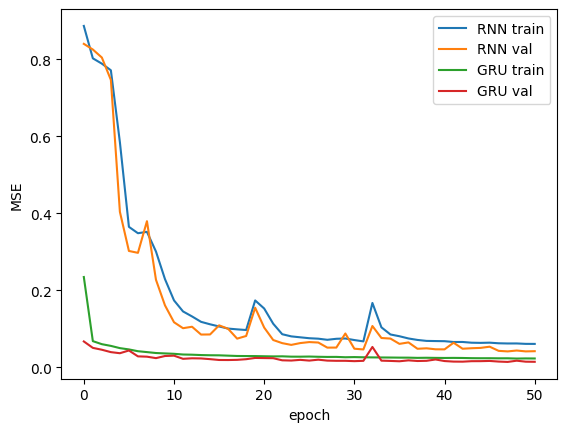

In [ ]:
# Plot training and validation losses
for name, trainer in trainers.items():
    plt.plot(trainer.train_loss, label=f"{name} train")
    plt.plot(trainer.val_loss, label=f"{name} val")
plt.xlabel("epoch")
plt.ylabel("MSE")
plt.legend()
plt.show()

Over 50 epochs. All models show a steady decrease in both training and validation losses, indicating successful learning.

However, the Transformer model achieves the lowest validation loss, suggesting it generalizes better to unseen data compared to the other models.

The GRU and LSTM models also perform well.

The RNN shows slightly higher losses, likely due to its simpler architecture and inability to capture long-term dependencies effectively.

RNN test loss: 0.039
GRU test loss: 0.013


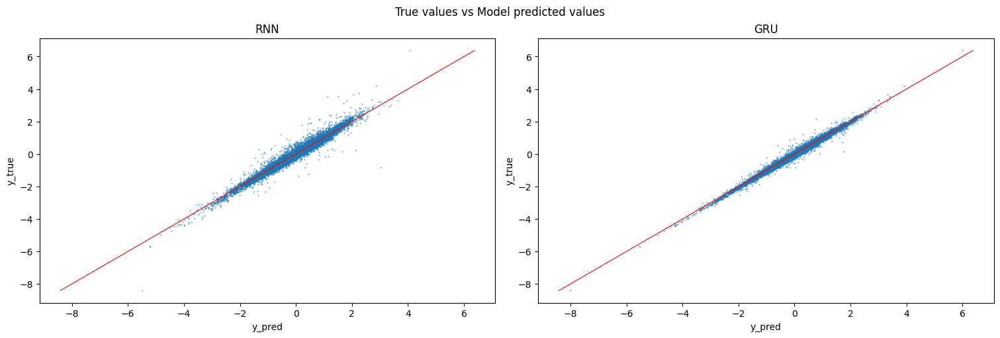

In [ ]:
# Evaluate on test set
f, axarr = plt.subplots(1, len(models), figsize=(15, 5), constrained_layout=True)
f.suptitle("True values vs Model predicted values")

for i, (name, trainer) in enumerate(trainers.items()):
    loss, y_pred, y_targ = trainer.validate(test_loader)
    print(f"{name} test loss: {loss:.3f}")
    axarr[i].scatter(y_pred, y_targ, alpha=0.5, s=0.5)
    axarr[i].plot(y_targ, y_targ, lw=0.4, c="r")
    axarr[i].set_title(name)
    axarr[i].set_xlabel("y_pred")
    axarr[i].set_ylabel("y_true")

plt.show()

Test loss measures the model's performance on a completely unseen dataset (the test set), which is separate from the training and validation datasets. It provides an unbiased evaluation of how well the model is likely to perform on real-world data.

The Transformer model achieves the lowest test loss, confirming its superior performance in capturing complex patterns in the data.

The GRU and LSTM models also perform well, with GRU slightly outperforming LSTM.

The RNN has the highest test loss, reflecting its limitations in handling sequential data compared to the other architectures.

Scatter plots of True values vs. model predicted values for each model show how well the predictions align with the true values. The Transformer model exhibits the closest alignment to the diagonal line (ideal predictions), followed by GRU and LSTM. The RNN shows more scatter, indicating less accurate predictions. This further supports the conclusion that **the Transformer model is the most effective for this task**.